In [6]:
from loaders import *
from pipeline import *

train_loader, val_loader, test_loader = get_loaders(speech_dirs=["dev-clean.tar", "test-clean.tar"],
                                                    noise_dir="./wham_noise//wham_noise",
                                                    batch_size=8,
                                                    padding_strategy=None)

# Load Datasets

In [4]:
url_spch_1 = "https://openslr.elda.org/resources/12/dev-clean.tar.gz"
file_name_spch_1 = "dev-clean.tar.gz"
url_spch_2 = "https://openslr.elda.org/resources/12/test-clean.tar.gz"
file_name_spch_2 = "test-clean.tar.gz"
url_noise = "https://my-bucket-a8b4b49c25c811ee9a7e8bba05fa24c7.s3.amazonaws.com/wham_noise.zip"
file_name_noise = "wham_noise.zip"

#download_file(url_spch_1, file_name_spch_1)
#download_file(url_spch_2, file_name_spch_2)
#download_file(url_noise, file_name_noise)
#extract_archive("wham_noise.zip")
extract_archive("dev-clean.tar.gz")
extract_archive("test-clean.tar.gz")

dev-clean.tar.gz:   0%|          | 0.00/322M [00:00<?, ?B/s]

File 'dev-clean.tar.gz' downloaded successfully.


test-clean.tar.gz:   0%|          | 0.00/331M [00:00<?, ?B/s]

File 'test-clean.tar.gz' downloaded successfully.


Extracting:   0%|          | 0/2943 [00:00<?, ?file/s]

An error occurred while extracting the archive: [Errno 13] Permission denied: 'dev-clean.tar/LibriSpeech/dev-clean/2277/149896/2277-149896-0026.flac'


Extracting:   0%|          | 0/2840 [00:00<?, ?file/s]

An error occurred while extracting the archive: [Errno 13] Permission denied: 'test-clean.tar/LibriSpeech/test-clean/6930/75918/6930-75918-0000.flac'


# Display Audio

In [2]:
from IPython.display import Audio 
sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

for i, (mixed_waveform, speech_waveform) in enumerate(zip(mixed_waveforms, speech_waveforms)):
    print(f"--------------------\nsample {i} from batch")
    print(f"Input audio {i + 1}:")
    display(Audio(mixed_waveform.numpy(), rate=train_loader.dataset.sample_rate))
    print(f"Target audio {i + 1}:")
    display(Audio(speech_waveform.numpy(), rate=train_loader.dataset.sample_rate))

    print('left channel')
    display(Audio(mixed_waveform.numpy()[0,:], rate=train_loader.dataset.sample_rate))
    print('right channel')
    display(Audio(mixed_waveform.numpy()[1,:], rate=train_loader.dataset.sample_rate))

--------------------
sample 0 from batch
Input audio 1:


Target audio 1:


left channel


right channel


--------------------
sample 1 from batch
Input audio 2:


Target audio 2:


left channel


right channel


--------------------
sample 2 from batch
Input audio 3:


Target audio 3:


left channel


right channel


--------------------
sample 3 from batch
Input audio 4:


Target audio 4:


left channel


right channel


--------------------
sample 4 from batch
Input audio 5:


Target audio 5:


left channel


right channel


--------------------
sample 5 from batch
Input audio 6:


Target audio 6:


left channel


right channel


--------------------
sample 6 from batch
Input audio 7:


Target audio 7:


left channel


right channel


--------------------
sample 7 from batch
Input audio 8:


Target audio 8:


left channel


right channel


# Plot Waveforms

<Figure size 1000x300 with 0 Axes>

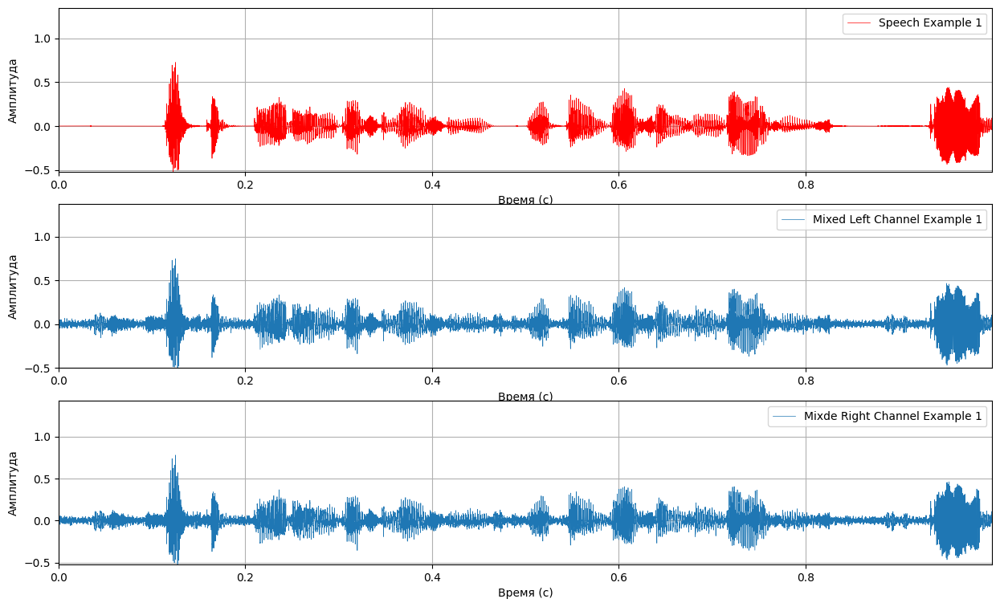

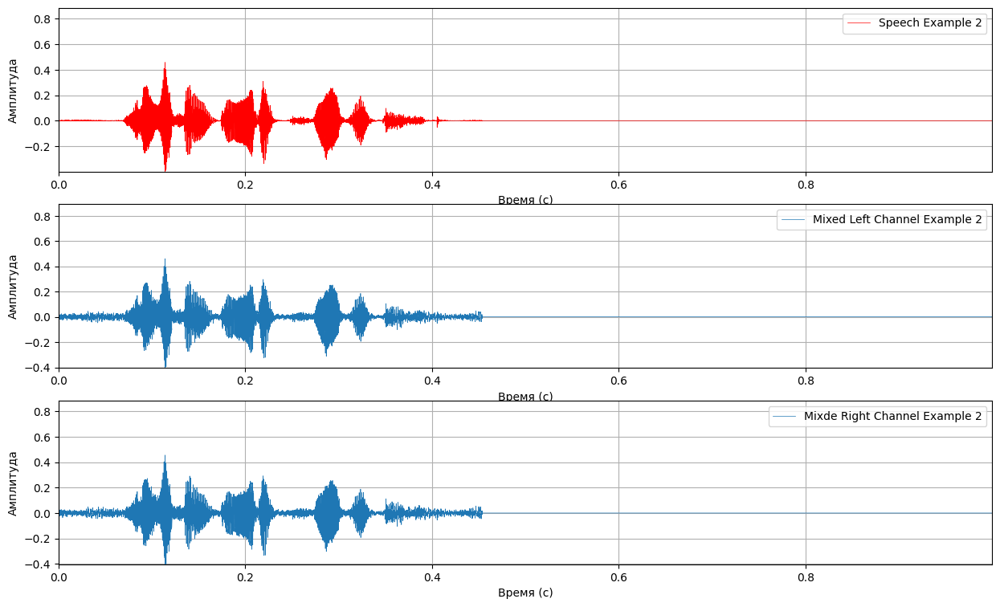

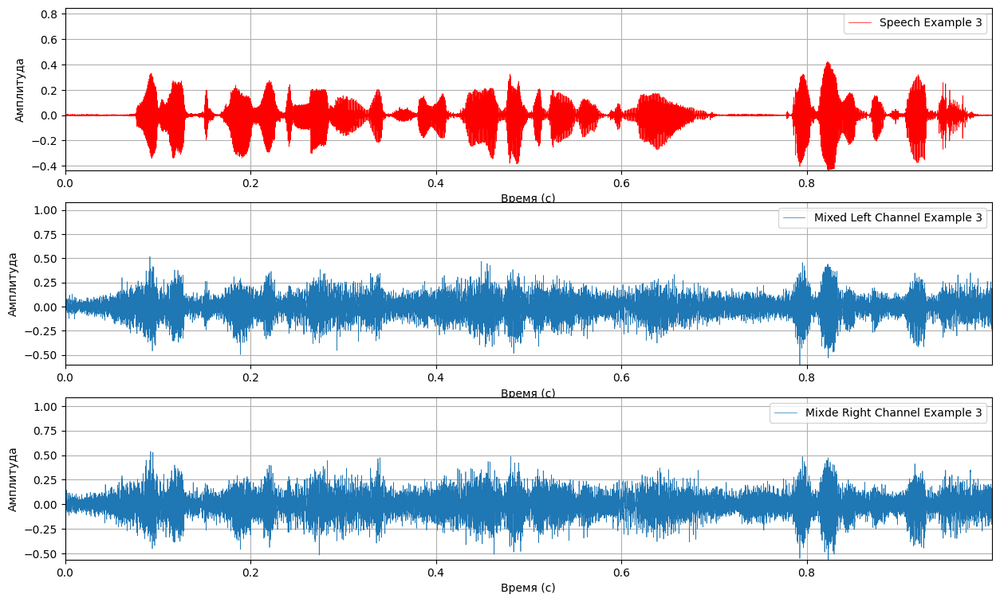

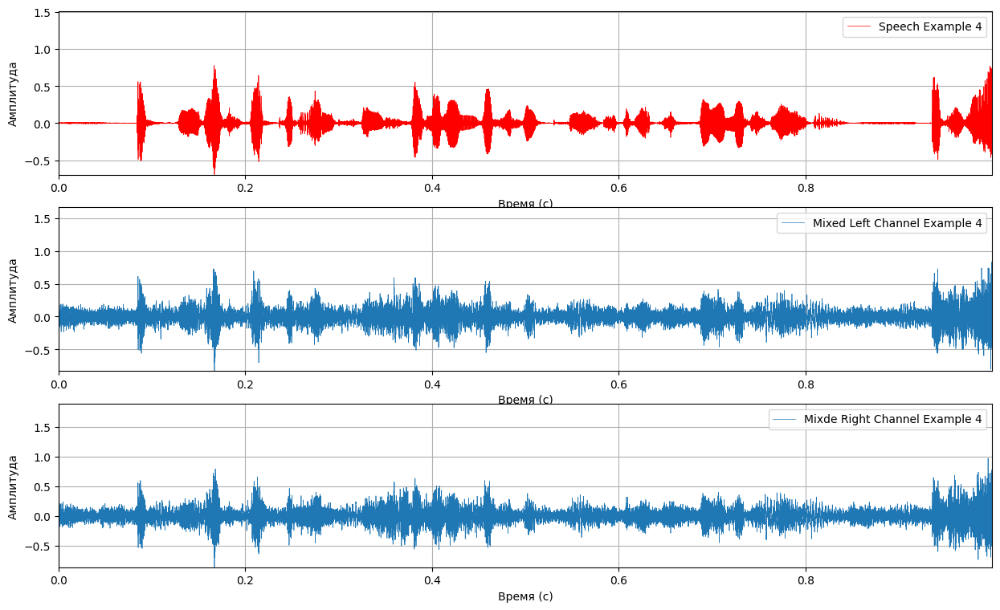

In [3]:
import matplotlib.pyplot as plt



waveform = mixed_waveforms.numpy()
waveform_sppech = speech_waveforms.numpy()

waveform_sppech = waveform_sppech[:, 0, :]
waveform_mono = waveform[:, 0, :]  # Левый канал
waveform_right = waveform[:, 1, :]  # Правый канал
# Время
time = np.arange(0, waveform_mono.shape[1]) / waveform_mono.shape[1]

plt.figure(figsize=(10, 3))
for i in range(4):
    plt.figure(i, figsize=(15, 9))

    plt.subplot(3, 1, 1)
    plt.plot(time, waveform_sppech[i, :], label=f'Speech Example {i+1}', linewidth=0.5,
             color='red')
    plt.xlabel('Время (с)')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.grid(True)
    plt.margins(0)
    ymin, ymax = plt.ylim()
    plt.ylim(ymin, ymax + 0.5 * (ymax - ymin))


    plt.subplot(3, 1, 2)
    plt.plot(time, waveform_mono[i, :], label=f'Mixed Left Channel Example {i+1}', linewidth=0.5)
    plt.xlabel('Время (с)')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.grid(True)
    plt.margins(0)
    ymin, ymax = plt.ylim()
    plt.ylim(ymin, ymax + 0.5 * (ymax - ymin))

    plt.subplot(3, 1, 3)
    plt.plot(time, waveform_right[i, :], label=f'Mixde Right Channel Example {i+1}', linewidth=0.5)
    plt.xlabel('Время (с)')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.grid(True)
    plt.margins(0)
    ymin, ymax = plt.ylim()
    plt.ylim(ymin, ymax + 0.5 * (ymax - ymin))

    plt.show()

# STFT Plot

In [3]:
import torchaudio

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

In [7]:
param = dict(n_fft = 1024, hop_length=256)
stft = torchaudio.transforms.Spectrogram(**param)
stft(mixed_waveforms).dtype

torch.float32

In [5]:
import librosa 
mixed_waveforms, speech_waveforms = sample_batch

stft1 = librosa.stft(mixed_waveforms.numpy(), n_fft = 1024, hop_length=256)  #[batch_size, channels, frequencies, time]
stft_speech1 = librosa.stft(speech_waveforms.numpy(), n_fft = 1024, hop_length=256)  #[batch_size, channels, frequencies, time]


stft2 = librosa.stft(mixed_waveforms.numpy(),  n_fft = 1024, hop_length = 256)
stft_speech2 = librosa.stft(speech_waveforms.numpy(),  n_fft = 1024, hop_length = 256)


In [6]:
stft1.shape

(8, 2, 513, 501)

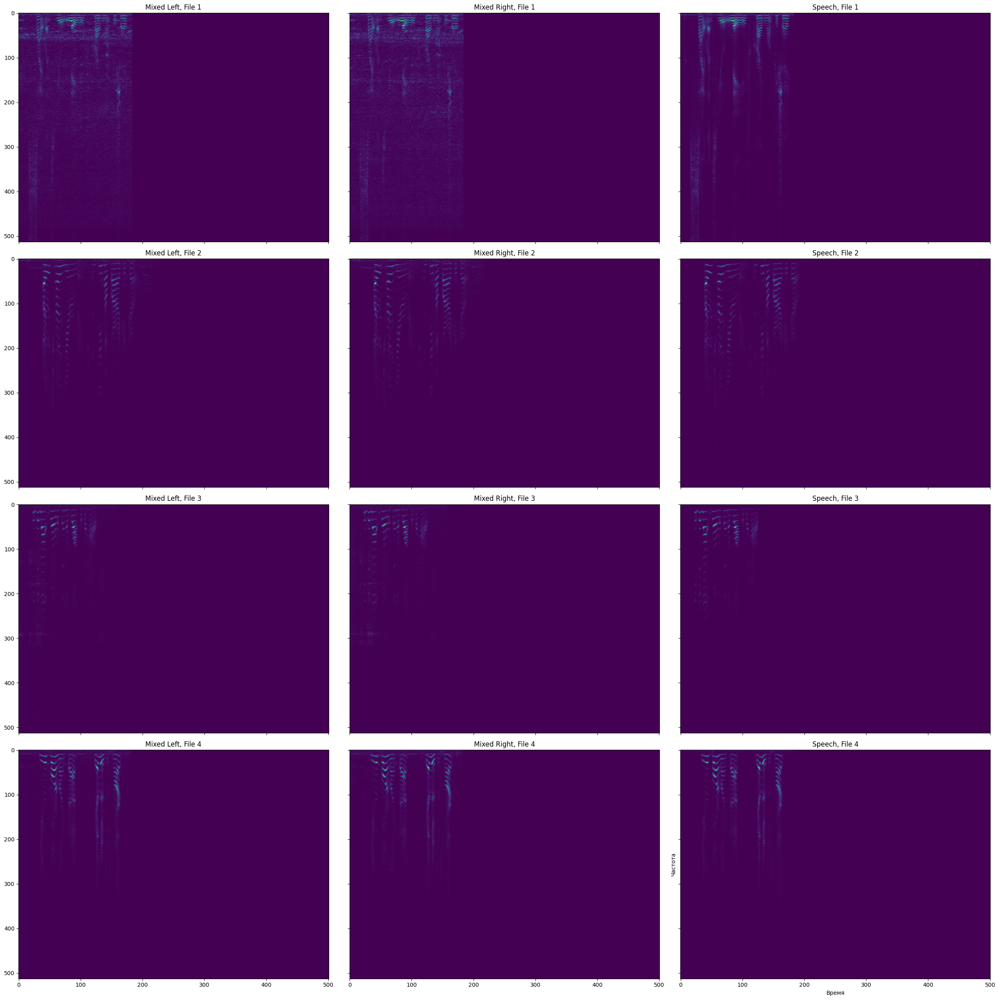

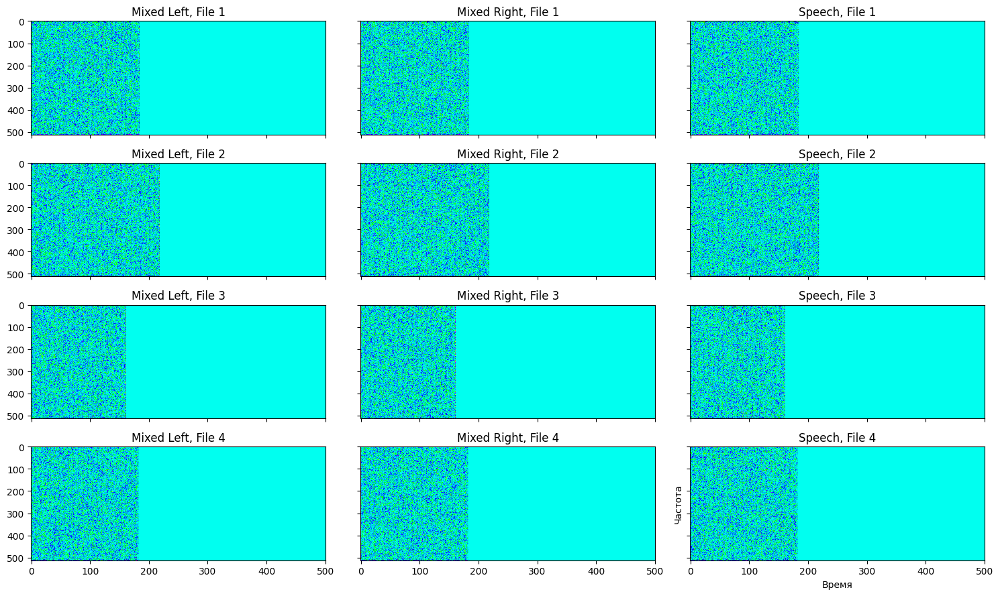

In [6]:
import torch
import numpy as np
import matplotlib.pyplot as plt


stft_numpy_noisy = stft1 #.numpy()
stft_numpy_clean = stft_speech1 #.numpy()

stft_magnitude_noisy = np.abs(stft_numpy_noisy)
stft_phase_noisy = np.angle(stft_numpy_noisy)

stft_magnitude_clean = np.abs(stft_numpy_clean)
stft_phase_clean = np.angle(stft_numpy_clean)

fig, axes = plt.subplots(4, 3, figsize=(25, 25), sharex=True, sharey=True)
for i in range(4):
    # Зашумленный сигнал
    axes[i, 0].imshow(stft_magnitude_noisy[i, 0, :, :], aspect='auto', cmap='viridis')
    axes[i, 0].set_title(f'Mixed Left, File {i+1}')
    axes[i, 1].imshow(stft_magnitude_noisy[i, 1, :, :], aspect='auto', cmap='viridis')
    axes[i, 1].set_title(f'Mixed Right, File {i+1}')
    axes[i, 2].imshow(stft_magnitude_clean[i, 0, :, :], aspect='auto', cmap='viridis')
    axes[i, 2].set_title(f'Speech, File {i+1}')



plt.xlabel('Время')
plt.ylabel('Частота')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(4, 3, figsize=(15, 9), sharex=True, sharey=True)
for i in range(4):
    # Зашумленный сигнал
    axes[i, 0].imshow(stft_phase_noisy[i, 0, :, :], aspect='auto', cmap='hsv')
    axes[i, 0].set_title(f'Mixed Left, File {i+1}')
    axes[i, 1].imshow(stft_phase_noisy[i, 1, :, :], aspect='auto', cmap='hsv')
    axes[i, 1].set_title(f'Mixed Right, File {i+1}')
    axes[i, 2].imshow(stft_phase_clean[i, 0, :, :], aspect='auto', cmap='hsv')
    axes[i, 2].set_title(f'Speech, File {i+1}')


plt.xlabel('Время')
plt.ylabel('Частота')
plt.tight_layout()
plt.show()

# SI SDR Check

In [7]:
y_true = torch.rand(4, 1, 81)
y_pred = torch.rand(4, 2, 81) 
loss1 = SiSDRLoss()
loss_fn = loss1(y_true, y_pred) 
loss_fn


tensor(19.9945)

# Init and Check Model

In [4]:
n_fft = 1023
hop_length = 250
center = True
input_signal_size = next(iter(train_loader))[0].shape[-1]

encoder_parameters = dict(in_channels=2,
                        out_channels = [64, 96, 128],
                        kernel_sizes = [3, 3, 3],
                        use_mobile = False,
                        act_func = nn.SiLU(),
                        do_bn = True,
                        do_sc = True,
                        dp = 0.4, 
                        num_blocks =3)




decoder_parameters = dict(in_channels=128, 
                        out_channels = [96, 64, 1],
                        kernel_sizes = [3, 3, 3], 
                        use_mobile = False,
                        act_func = nn.SiLU(),
                        do_bn = True,
                        do_sc = True, 
                        dp = 0.4,
                        num_blocks = 3)


model = denoising_model.DenoisingModel(encoder_parameters=encoder_parameters, decoder_parameters=decoder_parameters,
                                       input_signal_size = input_signal_size,
                                        n_fft = n_fft,
                                        hop_length = hop_length,
                                        center=center)



In [16]:
model

DenoisingModel(
  (encoder): SpectrumEncoder(
    (encoder_features): Sequential(
      (layer_0): AdaptiveResBlock(
        (block): BaseBlock(
          (conv): OutMaskedConv2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nb): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (dropout): Dropout2d(p=0.4, inplace=False)
          (act): SiLU()
        )
        (scale): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (adapt_res): Conv2d(2, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (layer_1): AdaptiveResBlock(
        (block): BaseBlock(
          (conv): OutMaskedConv2d(64, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nb): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (dropout): Dropout2d(p=0.4, inplace=False)
          (act): SiLU()
        )
        (scale): MaxPool2d(kernel_size=2, stride=2, padding

In [52]:
import torchaudio

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

tf = torchaudio.transforms.Spectrogram(n_fft=n_fft, hop_length=hop_length)

spec_1 = tf(mixed_waveforms)
spec_2 = tf(speech_waveforms)





In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
spec_1 = spec_1.to(device)

out = model(spec_1)


torch.Size([8, 128, 64, 64])
torch.Size([8, 128, 64, 64])


In [11]:
out.shape

torch.Size([8, 1, 512, 512])

# Training

In [26]:
import lightning as L
#import librosa
import torchaudio

encoder_attributes= dict(in_channels=2,
                        out_channels = [8, 16 , 32], 
                        kernel_sizes = [3, 5, 5],
                        use_mobile = False,
                        act_func = nn.Tanh(),
                        do_bn = [False, True, True],
                        do_sc = [False, True, True],
                        dp = [0.2, 0.2],
                        num_blocks = 3)




decoder_attributes = dict(in_channels=32, 
                        out_channels = [16, 8, 1], 
                        kernel_sizes = [5, 5, 3],
                        use_mobile = False,
                        act_func =nn.Tanh(),
                        do_bn = [False, True, True],
                        do_sc = [True, True, True], 
                        dp = [0.3, 0.4, 0.4],
                        num_blocks = 3)


model_attributes = dict(n_fft =512,
                    hop_length = 64,
                    hidden_gru = 512,
                    input_signal_size = 80000,
                    encoder_parameters = encoder_attributes,
                    decoder_parameters = decoder_attributes)



In [13]:
from lightning.pytorch.callbacks import ModelCheckpoint
import torch.optim as optim
import torch.nn.functional as F

class LightningModel(L.LightningModule):
    def __init__(self, attributes):
        super().__init__()
        
        self.n_fft = attributes['n_fft'] 
        self.hop_length = attributes['hop_length']
        self.model = DenoisingModel(**attributes)
        self.stft = torchaudio.transforms.Spectrogram(n_fft = self.n_fft, hop_length=self.hop_length, center=False)
        self.istft = torchaudio.transforms.InverseSpectrogram(n_fft = self.n_fft, hop_length=self.hop_length,center=False)

        #self.mae = nn.L1Loss()
        self.mse = nn.MSELoss()
        self.sisdr = SiSDRLoss() 
        
    def forward(self, x):
        return self.model(x)
    
    def configure_optimizers(self):
        
        optimizer = optim.Adam(self.model.parameters(), lr=3e-4)
        """linear = optim.lr_scheduler.LinearLR(optimizer,
                                            start_factor=1e-5,
                                            end_factor=1e-4,
                                            total_iters=4)"""
        
        
        #scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=10, eta_min=1e-10)
        scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.999)
        #scheduler =  optim.lr_scheduler.SequentialLR(optimizer, schedulers = [linear, decay], milestones=[2])
        

        lr_scheduler_config = {
            "scheduler": scheduler,

            "interval": "epoch",

            "frequency": 1,
        }

        return [optimizer] # [lr_scheduler_config]
    
    def configure_callbacks(self):
        checkpoint_callback = ModelCheckpoint(
            monitor="valid_loss",
            mode="max",
            save_top_k=1,
            filename="best-checkpoint-{epoch:02d}-{valid_loss:.2f}",
            save_last=True,
            every_n_epochs=1
        )
        return [checkpoint_callback]
    
    def training_step(self, batch):
        return self._step(batch, "train")

    def validation_step(self, batch):
        return self._step(batch, "valid")
    
    @staticmethod
    def masking(outs, inputs):
        
        if outs.shape[-2:] != inputs.shape[-2:]:
            
            if outs.size(2) >= inputs.size(2) and outs.size(3) >= inputs.size(3):
                
                padding_rows = outs.size(2) - inputs.size(2)  
                padding_cols = outs.size(3) - inputs.size(3)
                padded = F.pad(inputs, (0, padding_cols, 0, padding_rows))  
                masked = outs * padded
                return masked

            elif outs.size(2) <= inputs.size(2) and outs.size(3) <= inputs.size(3):
                padding_rows =  - (outs.size(2) - inputs.size(2) )
                padding_cols = -(outs.size(3) - inputs.size(3))
                padded = F.pad(outs, (0, padding_cols, 0, padding_rows))  
                masked = inputs * padded
                return masked
        else:
            masked = outs * inputs
            return masked
        

    def forward(self, mixed_waveforms):

        stft_mixed = self.stft(mixed_waveforms).to(self.device)
        
        mask = self.model(stft_mixed)
        #print(mask.shape)
        masked = self.masking(mask, stft_mixed)
        print(masked.shape)
        complex_m = torch.complex(masked, torch.zeros_like(masked))
        reverse_clear_mixed = self.istft(complex_m)

        return reverse_clear_mixed.to(torch.float32).to(self.device)
    
    def _step(self, batch, kind):
        mixed_waveforms, speech_waveforms = batch

        cleaned = self.forward(mixed_waveforms)
        #print(cleaned.shape)
        #print(speech_waveforms.shape)
        loss = self.sisdr(cleaned, speech_waveforms)
        #metric = self.sisdr(cleaned, speech_waveforms)
        
        metrics = {
            f"{kind}_metric": loss,
            f"{kind}_loss": loss,
        }
        self.log_dict(
            metrics,
            prog_bar=True,
            logger=True,
            on_step=True,
            on_epoch=True)

        return loss

In [27]:
from lightning.pytorch.callbacks import ModelCheckpoint
import torch.optim as optim
import torch.nn.functional as F
import librosa

class SpectrogramLightningModel(L.LightningModule):
    def __init__(self, attributes):
        super().__init__()
        
        self.n_fft = attributes['n_fft'] 
        self.hop_length = attributes['hop_length']
        self.stft = torchaudio.transforms.Spectrogram(n_fft = self.n_fft, hop_length=self.hop_length, center=True, normalized=False)
        self.model = DenoisingModel(**attributes)
        
        self.mse = nn.MSELoss()
        self.sisdr = SiSDRLoss() 
    
    def configure_optimizers(self):
        
        optimizer = optim.Adam(self.model.parameters(), lr=1.41e-4)
        """linear = optim.lr_scheduler.LinearLR(optimizer,
                                            start_factor=1e-5,
                                            end_factor=1e-4,
                                            total_iters=4)"""
        
        
        #scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=10, eta_min=1e-10)
        scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.999)
        #scheduler =  optim.lr_scheduler.SequentialLR(optimizer, schedulers = [linear, decay], milestones=[2])
        

        lr_scheduler_config = {
            "scheduler": scheduler,

            "interval": "epoch",

            "frequency": 1,
        }

        return [optimizer] # [lr_scheduler_config]
    
    def configure_callbacks(self):
        checkpoint_callback = ModelCheckpoint(
            monitor="valid_loss",
            mode="max",
            save_top_k=1,
            filename="best-checkpoint-{epoch:02d}-{valid_loss:.2f}",
            save_last=True,
            every_n_epochs=1
        )
        return [checkpoint_callback]
    
    def training_step(self, batch):
        return self._step(batch, "train")

    def validation_step(self, batch):
        return self._step(batch, "valid")
    
    @staticmethod
    def pad(outs, inputs):

        if outs.size(2) >= inputs.size(2) and outs.size(3) >= inputs.size(3):
            padding_rows = outs.size(2) - inputs.size(2)  
            padding_cols = outs.size(3) - inputs.size(3)
            padded = F.pad(inputs, (0, padding_cols, 0, padding_rows))  

        elif outs.size(2) <= inputs.size(2) and outs.size(3) <= inputs.size(3):
            padding_rows =  - (outs.size(2) - inputs.size(2) )
            padding_cols = -(outs.size(3) - inputs.size(3))
            padded = F.pad(outs, (0, padding_cols, 0, padding_rows))  

        return padded
    

    def forward(self, mixed_waveforms, speech_waveforms):

        stft_mixed = self.stft(mixed_waveforms).to(self.device)
        stft_clean = self.stft(speech_waveforms).to(self.device)

        output = self.model(stft_mixed)
        
        if output.shape != stft_clean.shape:
            output = self.pad(output, stft_clean)

        return output, stft_clean
    

    def invoke(self, noisy):
        stft_mixed = self.stft(noisy).to(self.device)
        with torch.no_grad():
            output = self.model(stft_mixed)

        out_signal = librosa.istft(output.cpu().numpy(), hop_length=self.hop_length, n_fft=self.n_fft, center=False)
        return output, out_signal


    def _step(self, batch, kind):

        mixed_waveforms, speech_waveforms = batch
        output, stft_clean = self.forward(mixed_waveforms, speech_waveforms)
        
        loss = self.mse(output, stft_clean)
        #metric = self.sisdr(cleaned, speech_waveforms)
        
        metrics = {
            f"{kind}_metric": loss,
            f"{kind}_loss": loss,
        }
        self.log_dict(
            metrics,
            prog_bar=True,
            logger=True,
            on_step=True,
            on_epoch=True)

        return loss

In [28]:
model = SpectrogramLightningModel(model_attributes)
trainer = L.Trainer(accelerator="auto",max_epochs=100,logger=True)                  
                            
                            

trainer.fit(model, train_loader, val_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: ModelCheckpoint
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type           | Params | Mode 
-------------------------------------------------
0 | stft  | Spectrogram    | 0      | train
1 | model | DenoisingModel | 10.5 M | train
2 | mse   | MSELoss        | 0      | train
3 | sisdr | SiSDRLoss      | 0      | train
-------------------------------------------------
10.5 M    Trainable params
0         Non-trainable params
10.5 M    Total params
42.083    Total estimated model params size (MB)
56        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [9]:
import pandas as pd

df = pd.read_csv('/home/ysergaev/CV/Project/lightning_logs/version_6/metrics.csv')
df[~df['valid_loss_epoch'].isna()]['valid_loss_epoch']

77     0.096992
157    0.038831
236    0.017156
316    0.011317
396    0.011023
475    0.011024
555    0.010995
Name: valid_loss_epoch, dtype: float64

# Test

In [29]:
model = SpectrogramLightningModel.load_from_checkpoint('/home/ysergaev/CV/Project/lightning_logs/version_18/checkpoints/last.ckpt',
                                             attributes = model_attributes)


In [30]:
batch = next(iter(train_loader))
mixed_waveforms, speech_waveforms = batch
mixed_waveforms = mixed_waveforms.to('cuda')
speech_waveforms = speech_waveforms.to('cuda')

batch = mixed_waveforms, speech_waveforms
loss = model._step(batch, 'train')



/home/ysergaev/CV/venv/lib/python3.12/site-packages/lightning/pytorch/core/module.py:445: You are trying to `self.log()` but the `self.trainer` reference is not registered on the model yet. This is most likely because the model hasn't been passed to the `Trainer`


In [31]:
cleaned, istft_sig = model.invoke(mixed_waveforms)

In [35]:
import torch
import numpy as np
import matplotlib.pyplot as plt


stft_magnitude_noisy = np.abs(cleaned.cpu().numpy())

fig, axes = plt.subplots(8, 1, figsize=(25, 25), sharex=True, sharey=True)
for i in range(8):
    # Зашумленный сигнал
    axes[i].imshow(stft_magnitude_noisy[i, 0, :, :], aspect='auto', cmap='viridis')
    axes[i].set_title(f'Cleaned, File {i+1}')
    



plt.xlabel('Время')
plt.ylabel('Частота')
plt.tight_layout()
plt.show()



KeyboardInterrupt: 

KeyboardInterrupt: 

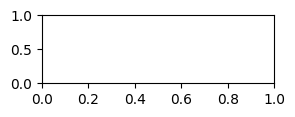

In [33]:
import matplotlib.pyplot as plt


time = np.arange(0, istft_sig.shape[1]) / istft_sig.shape[1]

for i in range(8):
    plt.figure(i, figsize=(3, 3))

    plt.subplot(3, 1, 1)
    plt.plot(time, istft_sig[i, :], label=f'Speech Example {i+1}', linewidth=0.5,
             color='red')
    plt.xlabel('Время (с)')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.grid(True)
    plt.margins(0)
    ymin, ymax = plt.ylim()
    plt.ylim(ymin, ymax + 0.5 * (ymax - ymin))

In [34]:
from IPython.display import Audio 


for i, (mixed_waveform) in enumerate(istft_sig):
    print(f"--------------------\nsample {i} from batch")
    print(f"Input audio {i + 1}:")

    display(Audio(mixed_waveform * np.max(mixed_waveform), rate=16000))


--------------------
sample 0 from batch
Input audio 1:


--------------------
sample 1 from batch
Input audio 2:


--------------------
sample 2 from batch
Input audio 3:


--------------------
sample 3 from batch
Input audio 4:


--------------------
sample 4 from batch
Input audio 5:


--------------------
sample 5 from batch
Input audio 6:


--------------------
sample 6 from batch
Input audio 7:


--------------------
sample 7 from batch
Input audio 8:
